In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import IPython.display as ipd
import librosa

import audio_features.visualization as v
import audio_features.extraction as feat

# Introduction

What is musical audio features?

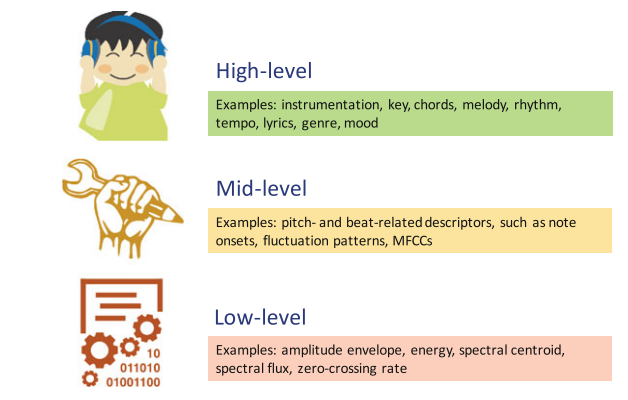

In [2]:
ipd.Image("img/f1.PNG")

"We use the term 'feature' to refer to a numerical (scalar, vector, or matrix) or nominal description of the music item under consideration, typically being the result of a feature extraction process. Feature extractors aim at transforming the raw data representing the music item into more descriptive representations, ideally describing musical aspects as perceived by humans, for instance, related to instrumentation, rhythmic structure, melody, or harmony."

- From: Knees, Peter, and Markus Schedl. Music similarity and retrieval: an introduction to audio-and web-based strategies. Vol. 9. Heidelberg: Springer, 2016.

## Librosa Features

**Features**

- Spectogram Features
    
    - Spectrogram features
        - **Spectral centroid**

        - **Spectral bandwidth** of p'th-order

        - **Spectral contrast**

        - **Spectral flatness**

        - **Spectral Roll-off frequency**

        - **Polynomial features**: Coefficients of fitting an nth-order polynomial to the columns of a spectrogram
        
    - Mel-scaled spectrogram
        - **Mel-frequency cepstral coefficients (MFCCs)**
        
- Chromagram Features

    - **Chromagram STFT**: A chromagram from a waveform or power spectrogram

    - **Constant-Q chromagram**

    - **Chroma Energy Normalized (CENS)**

- **Tonnetz**: The tonal centroid features (tonnetz)
    

- Energy features
    - **RMS**: Root-mean-square (RMS) value for each frame, either from the audio samples `y` or from a spectrogram `S`

    - **Zero crossing rate:** The zero-crossing rate of an audio time series

- Rhythm features
    - **Onset envelop**
    - **Tempo**: the tempo (beats per minute)
    - **Tempogram**: local autocorrelation of the onset strength envelope
    - **Tempogram Ratio**: also known as spectral rhythm patterns

---

**Decomposition**
- Median-filtering **harmonic percussive source separation** (HPSS)

---
**Feature Statistics for feature vectors**

- Mean
- Standard Deviation
- Skewness
- Kurtosis

- Minimum Value
- Maximum Value

## Feature Extraction

1. First, an audio is decomposed to harmonic part and percussive part. Then we have three audio(signal) time series `y`.

2. For each time series (`y`, `y_harm`, `y_perc`), compute features introduced above.

3. The features can be a scalar, a vector, or a matrix. In the case of the feature vectors, we generate mean, standard deviaton, skewness and kurtosis, or max of min value of each feature vector.

# Audio Example

Let's look at an example of a single audio wav file.

In [50]:
path_audio = "data/example2.wav"

- Digital signals information - 
 audio time series length: 661500 
 sampling rate: 22050 
 audio length: 30.0 seconds


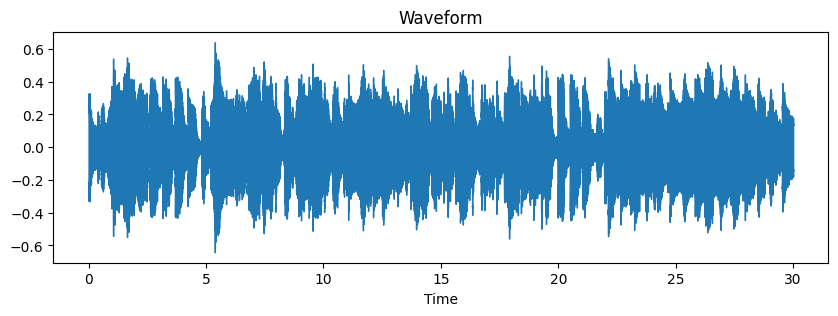

In [51]:
y= v.show_audio(path_audio,
                sr=22050,
                start=30,
                duration=30)

# Harmonic-Percussive Source Separation

## Harmonics-Percussive Source Separation

In [52]:
y_harm, y_perc = feat.hpss(y, margin=1.5)

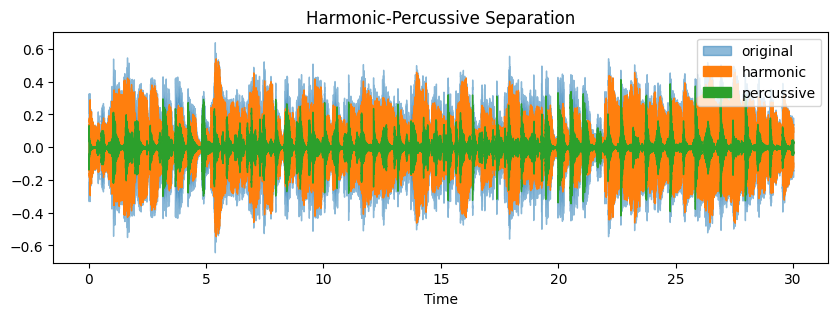

Harmonic


Percussive


In [53]:
v.show_hpss(y,
    y_harm,
    y_perc)

# Spectrogram Features 
- (Frequnecy Domain)

The STFT represents a signal in the time-frequency domain by computing discrete Fourier transforms (DFT) over short overlapping windows.

In [54]:
S_dB = feat.stft_mag(y, power='energy', return_dB=True)
S_dB_harm = feat.stft_mag(y_harm, power='energy', return_dB=True)
S_dB_perc = feat.stft_mag(y_perc, power='energy', return_dB=True)

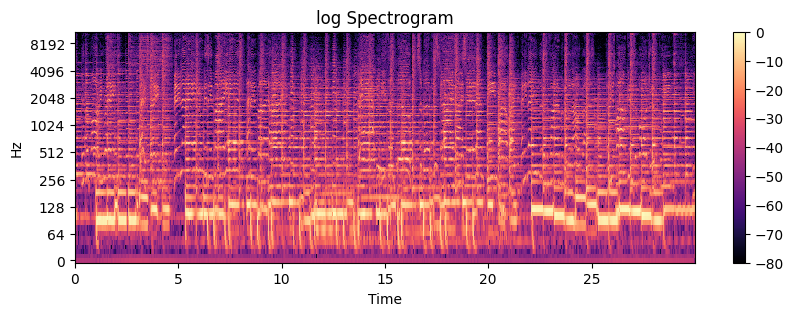

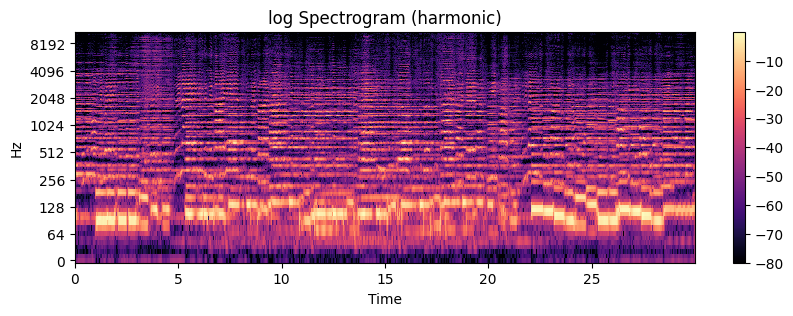

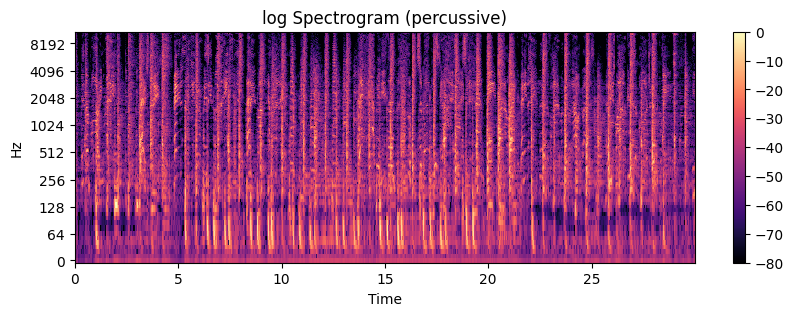

In [55]:
v.show_spectrogram(S_dB)
v.show_spectrogram(S_dB_harm, title='log Spectrogram (harmonic)')
v.show_spectrogram(S_dB_perc, title='log Spectrogram (percussive)')

## Spectral Centroids

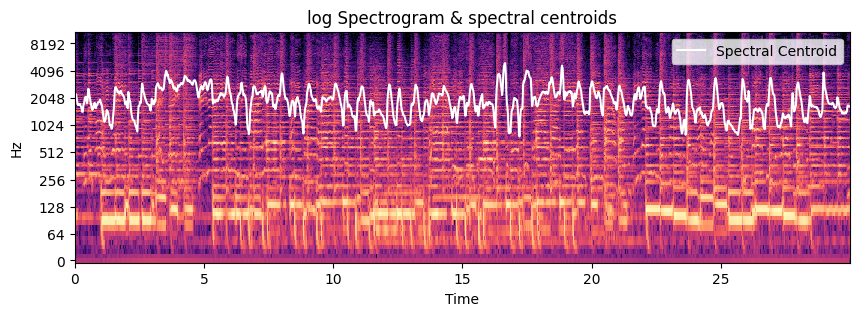

In [56]:
v.show_spectral_centroids(y)

## Spectral Bandwith

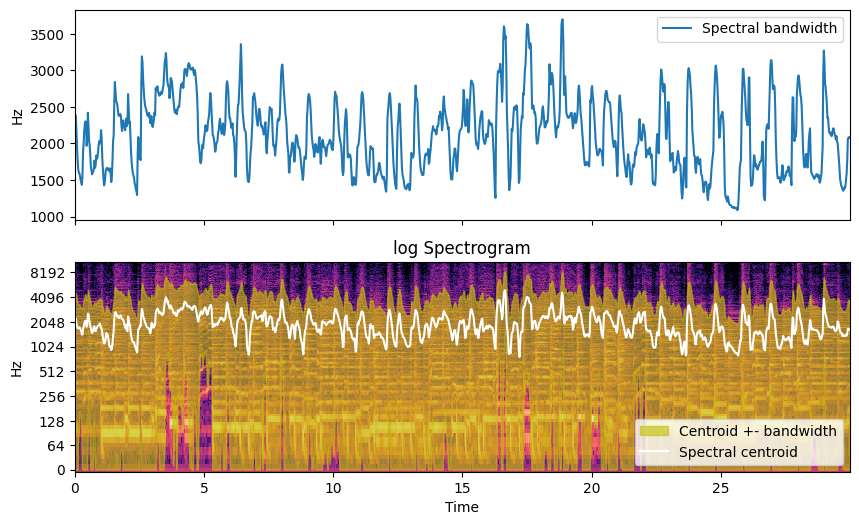

In [57]:
v.show_spectral_bandwidth(y)

## Spectral Contrast

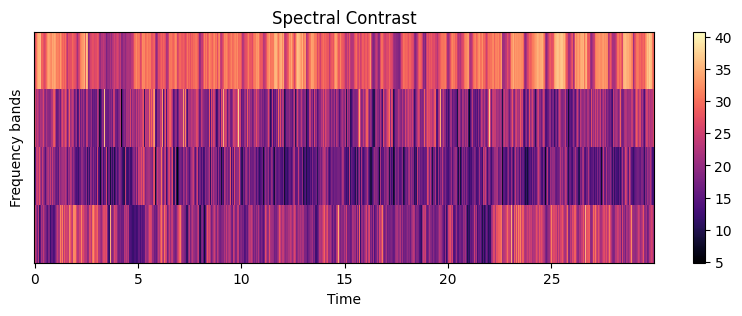

In [58]:
n_bands = 3
v.show_spectral_contrast(y, n_bands=n_bands)

## Spectral Flatness

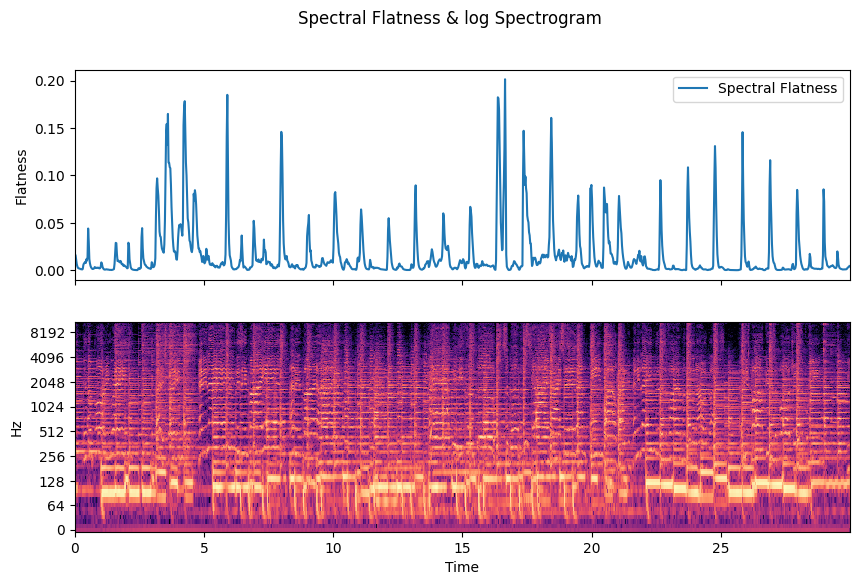

In [59]:
v.show_spectral_flatness(y)

## Spectral Rolloff

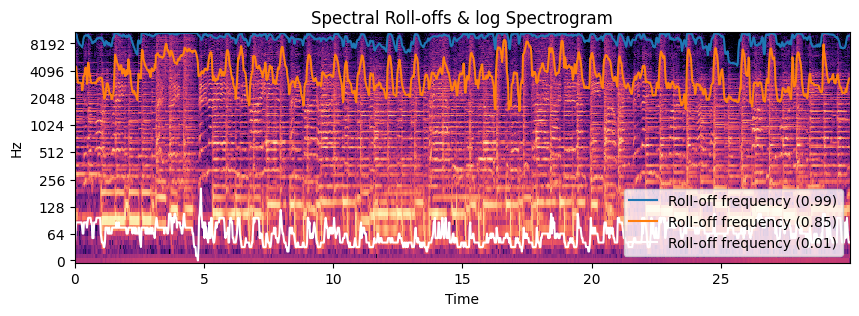

In [60]:
v.show_spectral_rolloff(y)

## Spectral Polynomial Coefficients

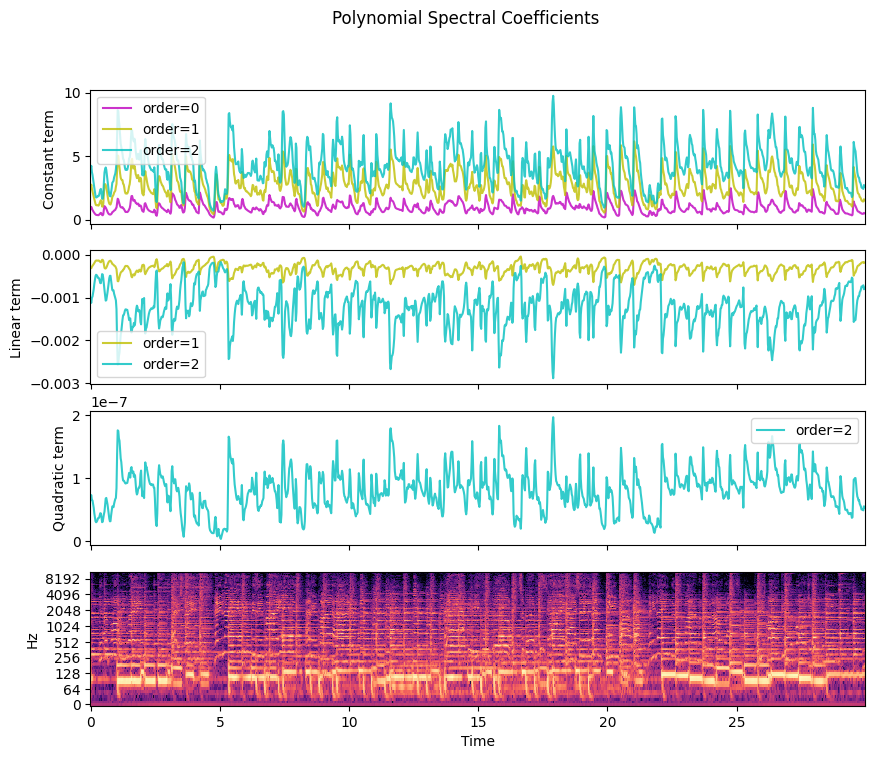

In [61]:
v.show_spectral_poly(y)

# Mel Spectorgram Features - MFCC
(Frequency Domain)

## MFCC (Mel-Frequency Cepstral Coefficients)

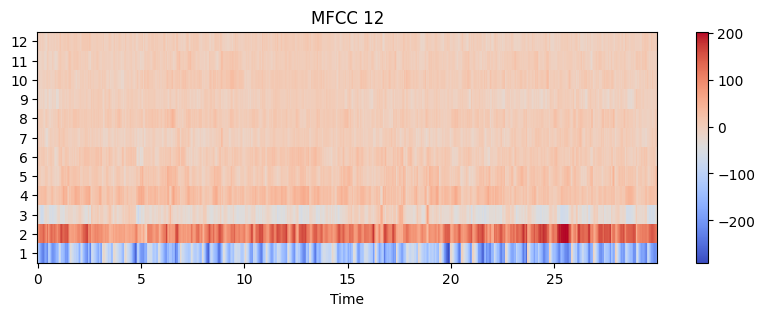

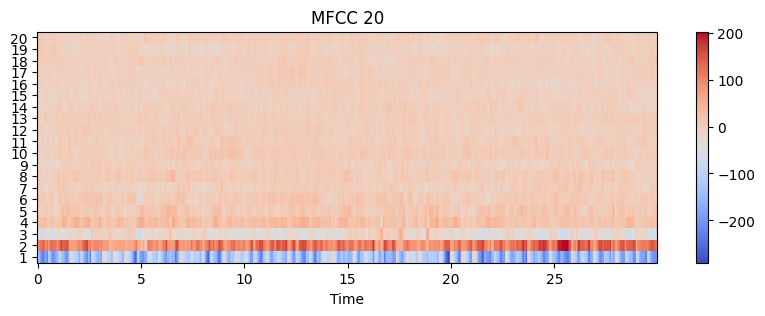

In [62]:
v.show_mfcc(y, n_mfcc=12)
v.show_mfcc(y, n_mfcc=20)

# Chromagram Features
(consists of 12 chromas)
- use harmonic part

## Chromagram STFT, CQT, CENS

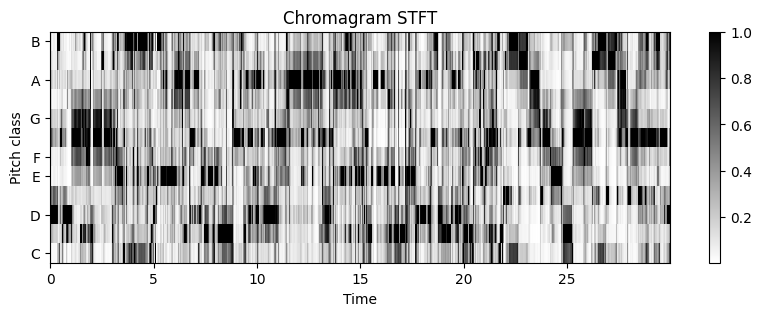

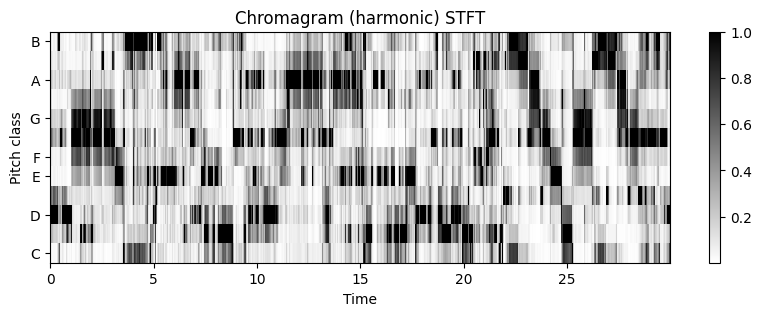

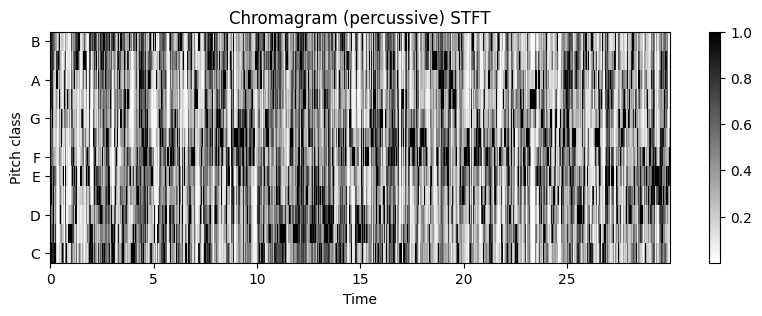

In [63]:
v.show_chromagram(y)
v.show_chromagram(y_harm, title='Chromagram (harmonic)')
v.show_chromagram(y_perc, title='Chromagram (percussive)')

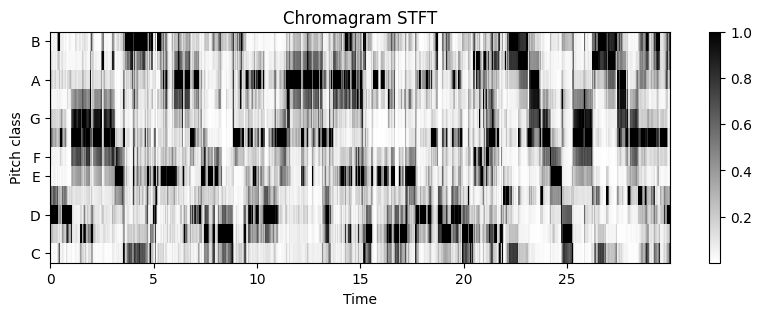

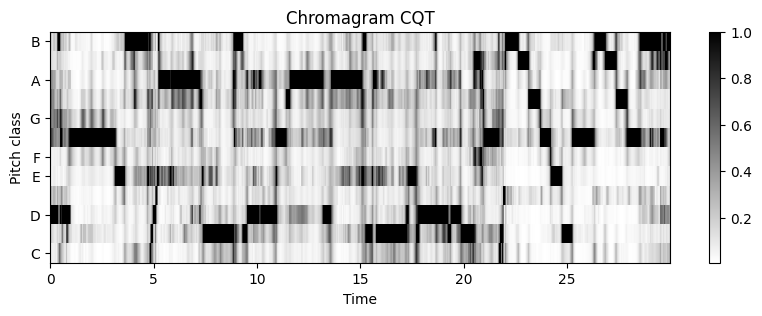

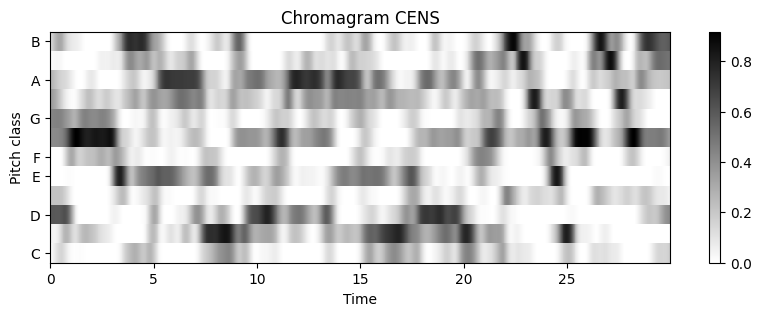

In [64]:
v.show_chromagram(y_harm, method='stft')
v.show_chromagram(y_harm, method='cqt')
v.show_chromagram(y_harm, method='cens')

## Tonnetz

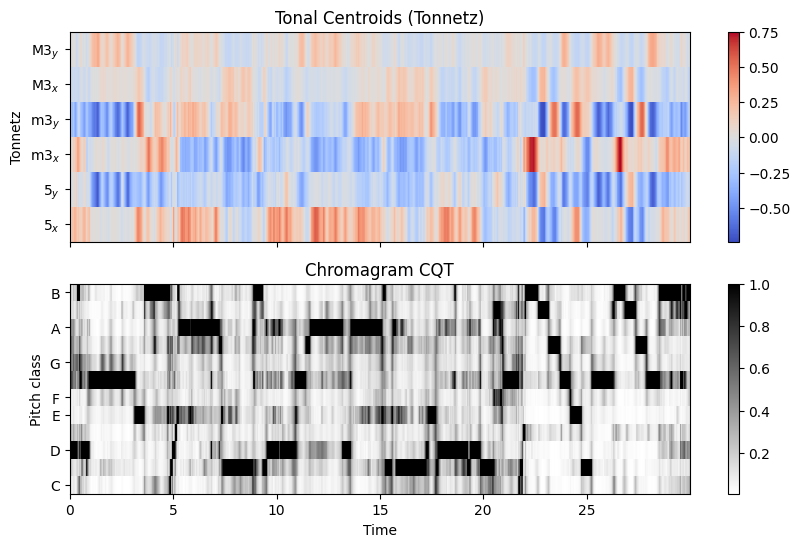

In [65]:
v.show_tonnetz(y_harm)

# Energy-based Features

## Zero Crossing Rate

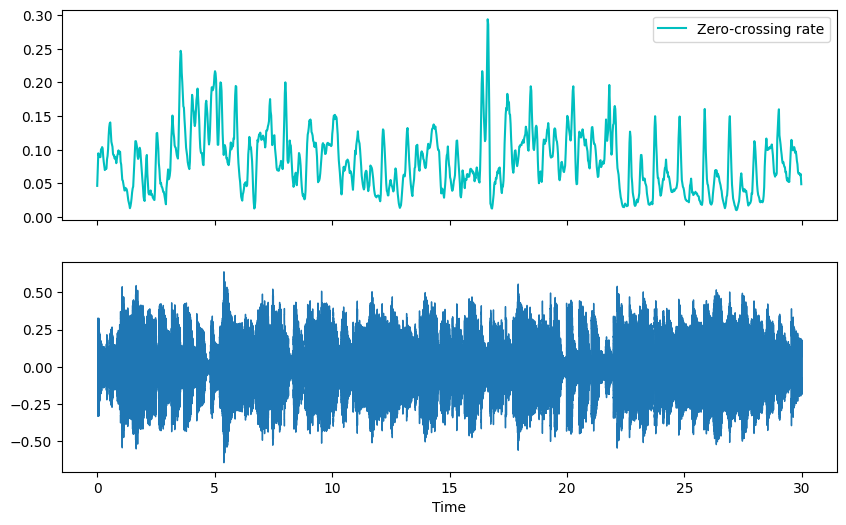

In [66]:
v.show_zcr(y)

## RMS

root-mean-square (RMS) value for each frame

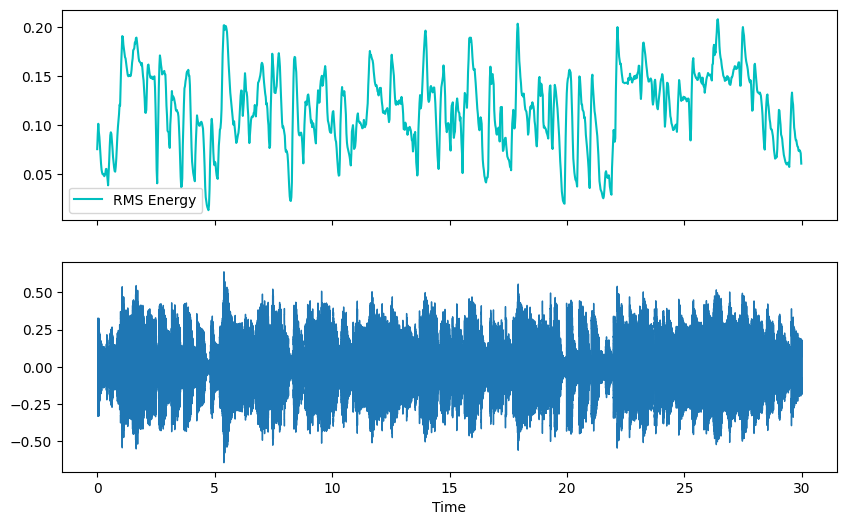

In [67]:
v.show_rms(y)

# Rhythm Features

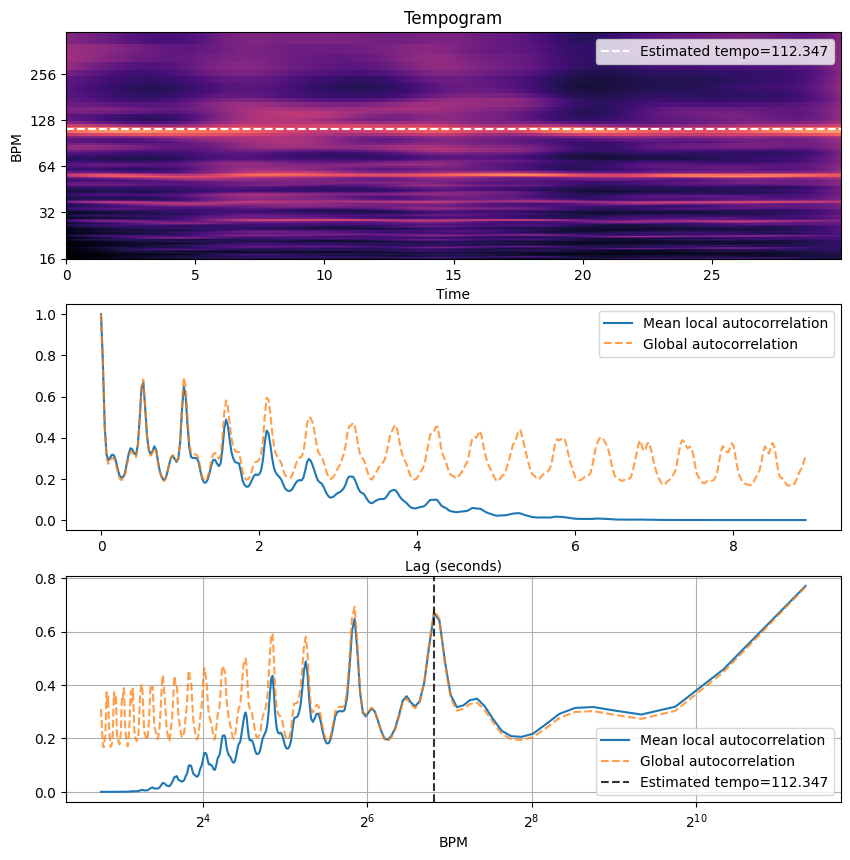

In [68]:
v.show_tempogram(y_perc)

## Onset strength

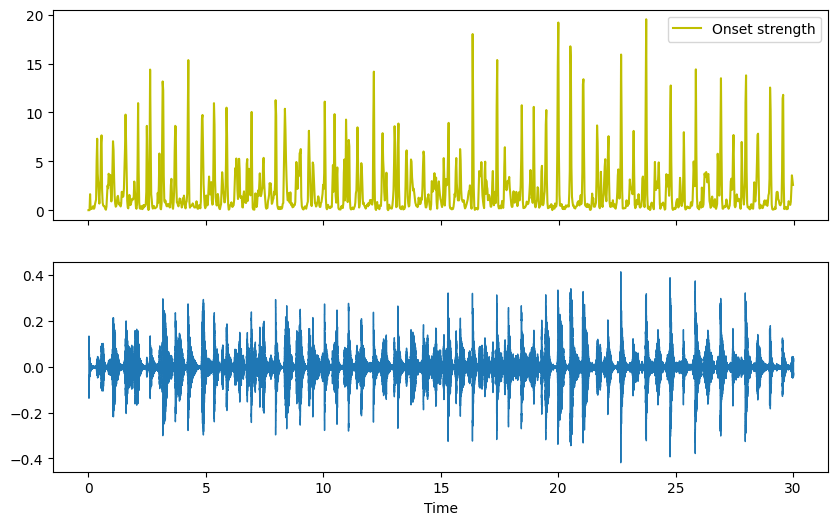

In [69]:
# Percussive
v.show_onset_strength(y_perc)

## BPM

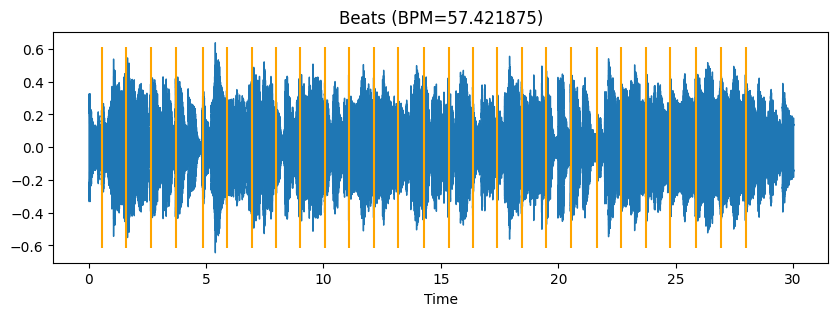

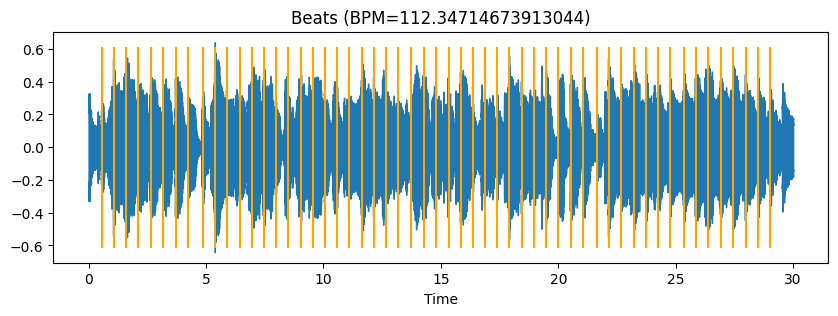

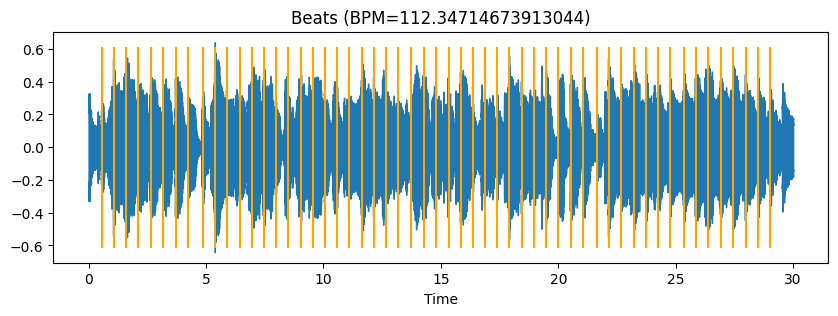

In [72]:
start_bpms = [60, 120, 180]
for bpm_ in start_bpms:
    bpm = v.show_bpm(y, start_bpm=bpm_)